Import and install Libraries


In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!pip install ydata_profiling

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 390.6/390.6 kB 1.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 9.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 29.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 10.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 69.9 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=a994168b48f8021f4f5a79195d205a14489c6ccfc9a0d40065026f0bf6c3a087
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin


In [6]:
import pandas as pd
from ydata_profiling import ProfileReport
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV
from sklearn import metrics
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.preprocessing import LabelEncoder
from sklearn import metrics


# 1.Data profiling

profile of dataset using ydata

In [4]:
football_df=pd.read_csv('/content/drive/MyDrive/usecase7/final_data.csv')

In [5]:
profile=ProfileReport(football_df,title='football profile')


In [ ]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

##Relevance:

In [7]:
# drop player column no need in analysis
football_df.drop(columns=['player'],inplace=True)

##Uniqueness:

In [8]:
football_df.duplicated().sum()

0

no duplicate

##completeness:

In [9]:
football_df.isnull().sum()

,0
team,0
name,0
position,0
height,0
age,0
appearance,0
goals,0
assists,0
yellow cards,0
second yellow cards,0


no null values >.<

##Accuracy check:

In [10]:
football_df.dtypes

,0
team,object
name,object
position,object
height,float64
age,float64
appearance,int64
goals,float64
assists,float64
yellow cards,float64
second yellow cards,float64


In [11]:
football_df['age']=football_df['age'].astype('int')

##univariate:

In [12]:
# drop rows that appearance = 0
football_df=football_df[(football_df['appearance']>0)]

In [13]:
football_df.shape

(10365, 21)

In [14]:
# height between 164-200 good
football_df=football_df[(football_df['height']>=164)&(football_df['height']<=200)]

<Axes: xlabel='height', ylabel='Count'>

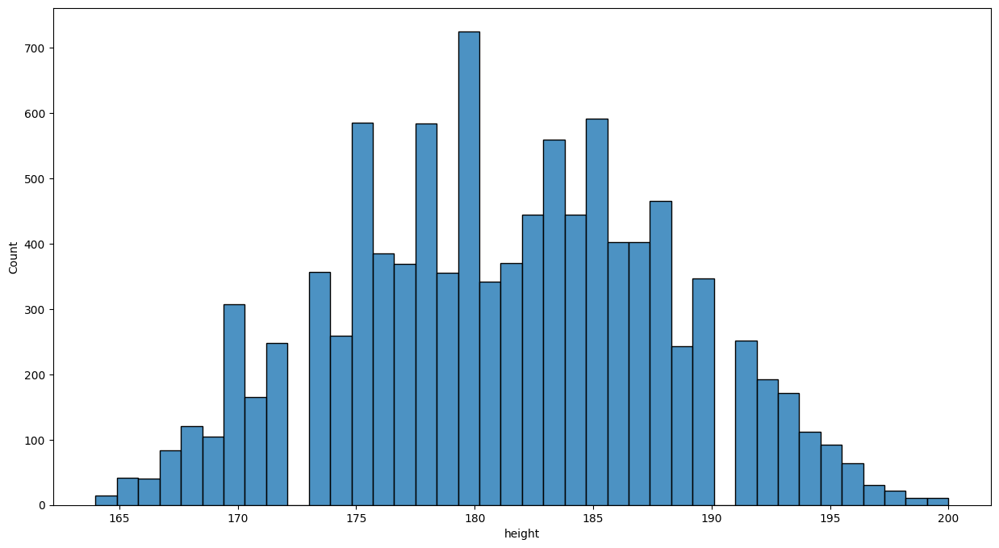

In [15]:
plt.figure(figsize=(15,8))
sns.histplot(
    football_df,
    x="height",
    # hue="Category", # color of plot elements
    multiple="stack", # also can be layer or dodge or fill
    alpha=0.8)

In [16]:
football_df.shape

(10317, 21)

In [17]:
football_df=football_df[(football_df['age']>=17)&(football_df['age']<=40)]

<Axes: xlabel='age', ylabel='Count'>

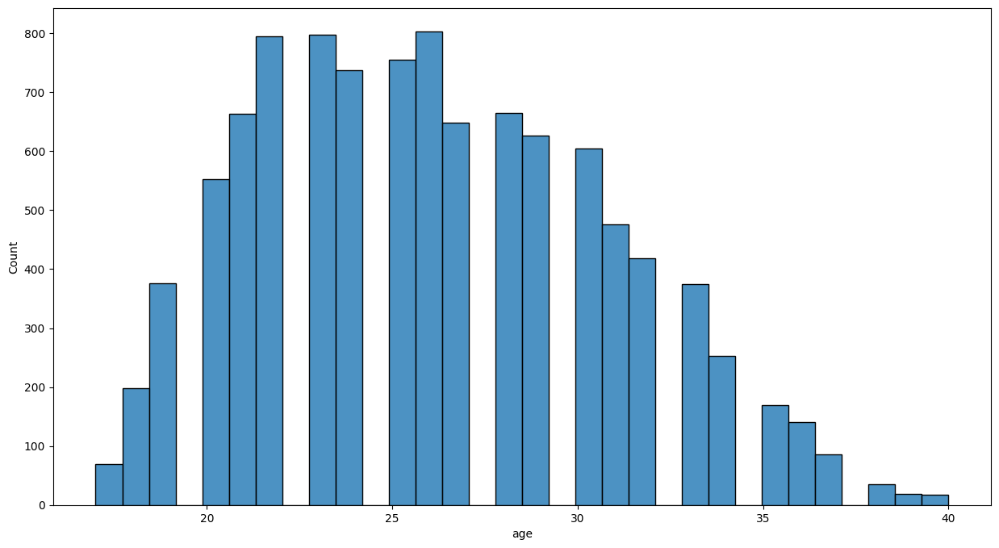

In [18]:
plt.figure(figsize=(15,8))
sns.histplot(
    football_df,
    x="age",
    # hue="Category", # color of plot elements
    multiple="stack", # also can be layer or dodge or fill
    alpha=0.8)

In [19]:
football_df.shape

(10282, 21)

<Axes: xlabel='minutes played', ylabel='Count'>

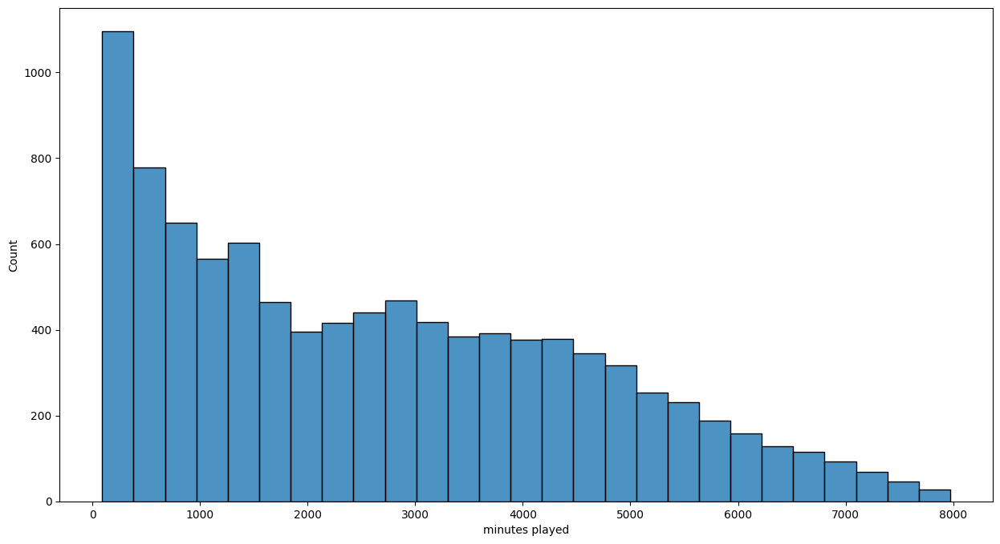

In [20]:
plt.figure(figsize=(15,8))
sns.histplot(
    football_df[(football_df['minutes played']<=8000)&(football_df['minutes played']>=90)],
    x="minutes played",
    # hue="Category", # color of plot elements
    multiple="stack", # also can be layer or dodge or fill
    alpha=0.8)

In [21]:
football_df=football_df[(football_df['minutes played']<=8000)&(football_df['minutes played']>=90)]

In [22]:
football_df.shape

(9804, 21)

In [23]:
# put goal keeper in other dataframe because their assists = 0
goalkeepers_df=football_df[football_df['position']=='Goalkeeper']

In [24]:
football_df=football_df[football_df['position']!='Goalkeeper']

In [25]:
football_df.shape

(8806, 21)

In [26]:
 #  Filter out values that occur only once
value_counts = football_df['current_value'].value_counts()


values_to_keep = value_counts[value_counts > 2].index
football_df = football_df[football_df['current_value'].isin(values_to_keep)]


In [27]:
football_df.shape

(8782, 21)

<Axes: xlabel='award', ylabel='Count'>

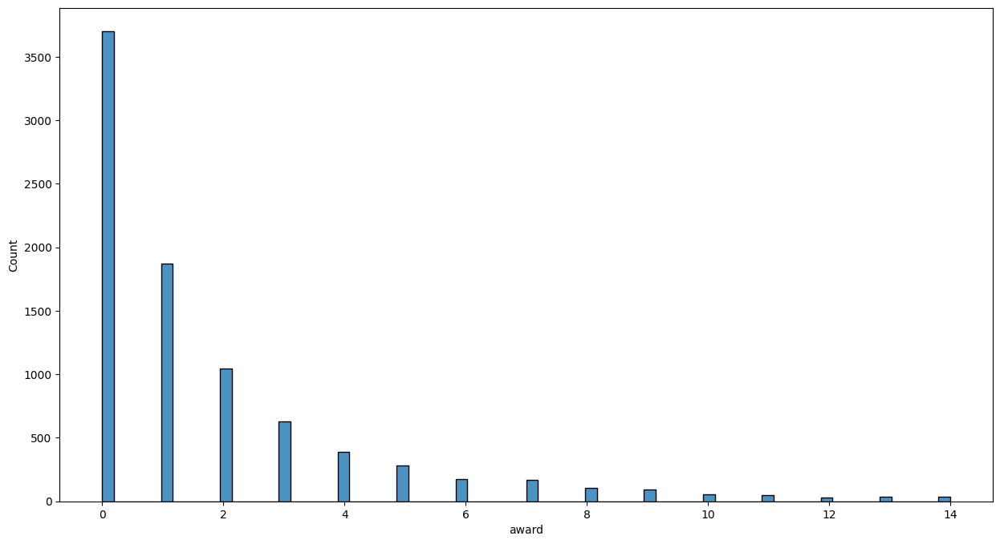

In [28]:
plt.figure(figsize=(15,8))
sns.histplot(
    football_df[football_df['award']<=14],
    x="award",
    # hue="Category", # color of plot elements
    multiple="stack", # also can be layer or dodge or fill
    alpha=0.8)

In [29]:
football_df=football_df[football_df['award']<=14]

In [30]:
football_df.shape

(8664, 21)

<Axes: xlabel='appearance', ylabel='Count'>

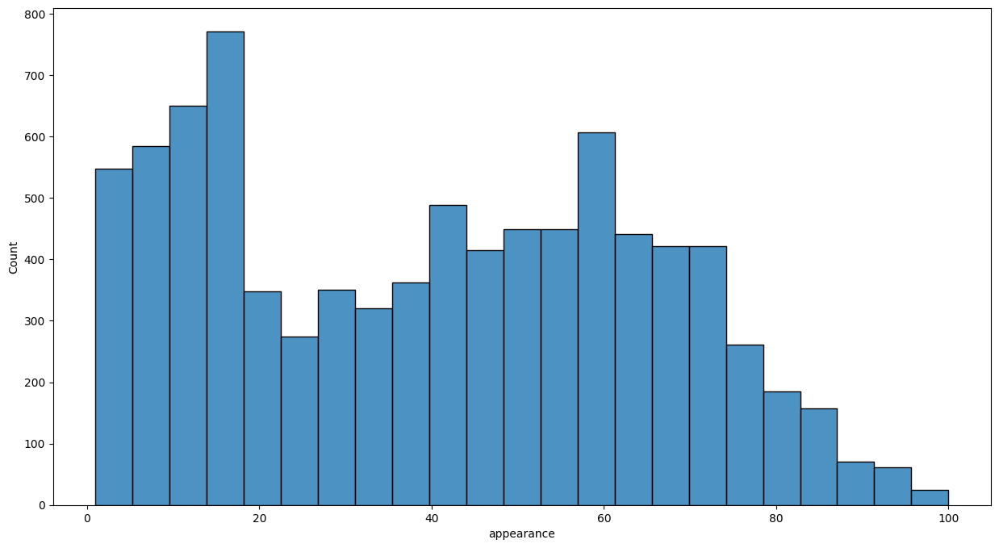

In [31]:
plt.figure(figsize=(15,8))
sns.histplot(
    football_df[football_df['appearance']<=100],
    x="appearance",
    # hue="Category", # color of plot elements
    multiple="stack", # also can be layer or dodge or fill
    alpha=0.8)

In [32]:
football_df=football_df[football_df['appearance']<=100]

In [33]:
football_df.shape

(8657, 21)

In [34]:
ball_df=football_df[(football_df['current_value']>=10000)&(football_df['highest_value']<=150000000)]

In [35]:
ball_df.shape

(8586, 21)

# 2.Feature engineering:


In [36]:
#  LabelEncoder from the sklearn.preprocessing module to convert categorical labels in the team column of a DataFrame into numerical format.
label_encoder = LabelEncoder()
ball_df['team_encoded'] = label_encoder.fit_transform(ball_df['team'])
ball_df['position_encoded'] = label_encoder.fit_transform(ball_df['position'])

<ipython-input-36-a1c0c4d1f77f>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ball_df['team_encoded'] = label_encoder.fit_transform(ball_df['team'])
<ipython-input-36-a1c0c4d1f77f>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ball_df['position_encoded'] = label_encoder.fit_transform(ball_df['position'])


In [37]:
ball_df

,team,name,position,height,age,appearance,goals,assists,yellow cards,second yellow cards,...,clean sheets,minutes played,days_injured,games_injured,award,current_value,highest_value,position_encoded,winger,team_encoded
3,Manchester United,Lisandro Martínez,Defender Centre-Back,175.000000,25,82,0.028090,0.056180,0.224719,0.0000,...,0.0,6408,175,22,9,50000000,50000000,6,0,226
5,Manchester United,Harry Maguire,Defender Centre-Back,194.000000,30,68,0.037799,0.000000,0.302394,0.0189,...,0.0,4762,148,27,1,25000000,70000000,6,0,226
6,Manchester United,Victor Lindelöf,Defender Centre-Back,187.000000,28,70,0.000000,0.032901,0.115153,0.0000,...,0.0,5471,95,19,10,15000000,35000000,6,0,226
7,Manchester United,Phil Jones,Defender Centre-Back,185.000000,31,8,0.000000,0.000000,0.216346,0.0000,...,0.0,416,932,169,7,2000000,20000000,6,0,226
8,Manchester United,Teden Mengi,Defender Centre-Back,186.000000,21,34,0.000000,0.000000,0.130529,0.0000,...,0.0,2758,47,13,0,2000000,2000000,6,0,226
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10749,Western Sydney Wanderers,Aidan Simmons,Attack-RightWinger,181.240353,20,16,0.175953,0.087977,0.263930,0.0000,...,0.0,1023,0,0,0,75000,75000,3,1,365
10750,Western Sydney Wanderers,Kusini Yengi,Attack Centre-Forward,190.000000,24,26,0.372671,0.186335,0.186335,0.0000,...,0.0,1449,102,18,0,300000,300000,1,0,365
10751,Western Sydney Wanderers,Nathanael Blair,Attack Centre-Forward,181.240353,19,20,0.375000,0.000000,0.187500,0.0000,...,0.0,960,0,0,0,50000,50000,1,0,365
10752,Western Sydney Wanderers,Zachary Sapsford,Attack Centre-Forward,181.240353,20,17,0.312139,0.104046,0.000000,0.0000,...,0.0,865,0,0,0,50000,50000,1,0,365


In [ ]:
# no need to put position and team i already encoded them in new columns
# categorical_features=['name']

In [ ]:
# no need dummies categorical because i checked before and there's no corr
# df = pd.get_dummies(ball_df, columns=categorical_features)

In [38]:
ball_df.shape

(8586, 22)

In [39]:
df=ball_df

## 3.Feature selection


In [40]:
df

,team,name,position,height,age,appearance,goals,assists,yellow cards,second yellow cards,...,clean sheets,minutes played,days_injured,games_injured,award,current_value,highest_value,position_encoded,winger,team_encoded
3,Manchester United,Lisandro Martínez,Defender Centre-Back,175.000000,25,82,0.028090,0.056180,0.224719,0.0000,...,0.0,6408,175,22,9,50000000,50000000,6,0,226
5,Manchester United,Harry Maguire,Defender Centre-Back,194.000000,30,68,0.037799,0.000000,0.302394,0.0189,...,0.0,4762,148,27,1,25000000,70000000,6,0,226
6,Manchester United,Victor Lindelöf,Defender Centre-Back,187.000000,28,70,0.000000,0.032901,0.115153,0.0000,...,0.0,5471,95,19,10,15000000,35000000,6,0,226
7,Manchester United,Phil Jones,Defender Centre-Back,185.000000,31,8,0.000000,0.000000,0.216346,0.0000,...,0.0,416,932,169,7,2000000,20000000,6,0,226
8,Manchester United,Teden Mengi,Defender Centre-Back,186.000000,21,34,0.000000,0.000000,0.130529,0.0000,...,0.0,2758,47,13,0,2000000,2000000,6,0,226
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10749,Western Sydney Wanderers,Aidan Simmons,Attack-RightWinger,181.240353,20,16,0.175953,0.087977,0.263930,0.0000,...,0.0,1023,0,0,0,75000,75000,3,1,365
10750,Western Sydney Wanderers,Kusini Yengi,Attack Centre-Forward,190.000000,24,26,0.372671,0.186335,0.186335,0.0000,...,0.0,1449,102,18,0,300000,300000,1,0,365
10751,Western Sydney Wanderers,Nathanael Blair,Attack Centre-Forward,181.240353,19,20,0.375000,0.000000,0.187500,0.0000,...,0.0,960,0,0,0,50000,50000,1,0,365
10752,Western Sydney Wanderers,Zachary Sapsford,Attack Centre-Forward,181.240353,20,17,0.312139,0.104046,0.000000,0.0000,...,0.0,865,0,0,0,50000,50000,1,0,365


In [41]:
df = df[['appearance', 'minutes played', 'current_value']]


## 4.Prepare train and test data


In [42]:
# Prepare data
X = df


# sacle the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [43]:
X.shape

(8586, 3)

#Buliding the Model:

In [44]:
wcss = []
for i in range(1, 20):  # Test 1 to 10 clusters
    kmeans = KMeans(n_clusters=i,
                    init='k-means++',
                    max_iter=300,
                    n_init=10,
                    random_state=0)
    kmeans.fit(X_scaled)
    wcss.append(kmeans.inertia_)  # inertia_ is the WCSS

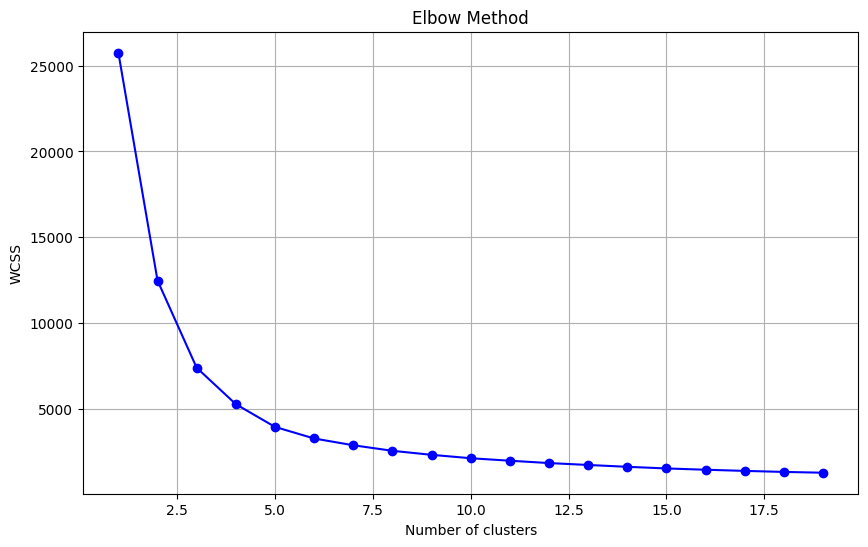

In [45]:
# 3. Plot the Elbow Curve
plt.figure(figsize=(10, 6))
plt.plot(range(1, 20), wcss,  marker='o', linestyle='-', color='b')
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.grid(True)
plt.show()

In [50]:
# Optional: Apply k-Means using the optimal number of clusters
optimal_clusters = 3 # This might change based on your actual elbow curve analysis
model = KMeans(n_clusters=optimal_clusters, init='k-means++', max_iter=300, n_init=10, random_state=0)

# train the model:

In [51]:
# Fit the model on the training data
y_pred = model.fit_predict(X_scaled)

# test the model:

##Evaluating the Model


In [52]:
X.head(2)


,appearance,minutes played,current_value
3,82,6408,50000000
5,68,4762,25000000


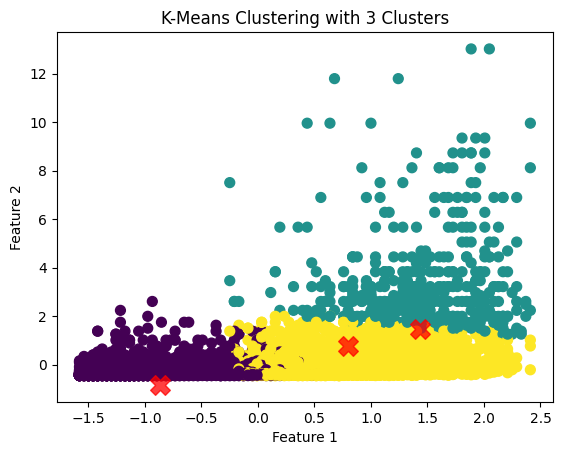

In [56]:
# Plotting the clusters with optimal number
plt.scatter(X_scaled[:, 0], X_scaled[:, 2], c=y_pred, s=50, cmap='viridis')

centers = model.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='red', s=200, alpha=0.75, marker='X')
plt.title(f'K-Means Clustering with {optimal_clusters} Clusters')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.show()